**Employee Performace Analysis**

**Business Case:Based on given feature or dataset we need to predict the performance rating of employee**

**Import Library**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings as wr
wr.filterwarnings('ignore')

**Load The dataset**

In [ ]:
data = pd.read_excel('/content/INX_Future_Inc_Employee_Performance_CDS_Project2_Data_V1.8.xls')
pd.set_option('display.max_columns',None)
data

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,71,4,2,4,1,Yes,20,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,80,4,1,4,3,No,17,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,74,4,1,3,1,Yes,11,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,46,2,3,2,1,No,14,2,9,3,4,8,7,7,7,No,3


**Basic Checks**

In [ ]:
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3


In [ ]:
data.tail()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
1195,E100992,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,71,4,2,4,1,Yes,20,2,6,3,3,6,5,0,4,No,4
1196,E100993,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,80,4,1,4,3,No,17,1,4,2,3,1,0,0,0,No,3
1197,E100994,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,74,4,1,3,1,Yes,11,3,20,3,3,20,8,3,8,No,3
1198,E100995,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,46,2,3,2,1,No,14,2,9,3,4,8,7,7,7,No,3
1199,E100998,24,Female,Life Sciences,Single,Sales,Sales Executive,Travel_Rarely,3,2,1,65,3,2,3,9,No,14,1,4,3,3,2,2,2,0,Yes,2


In [ ]:
data.describe()

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [ ]:
data.columns

Index(['EmpNumber', 'Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

In [ ]:
data.shape

(1200, 28)

In [ ]:
data.size

33600

**EDA**

**Continuous Data**

Plot Used-histogram: A histogram is a bar graph-like representation of data that buckets a range of classes into columns along the horizontal x-axis. The vertical y-axis represents the number count or percentage of occurrences in the data for each column.

lineplots:A Line plot can be defined as a graph that displays data as points or check marks above a number line, showing the frequency of each value.

**Discrete Data**

Countplot: countplot is used to Show the counts of observations in each categorical bin using bars.


**1] Age**

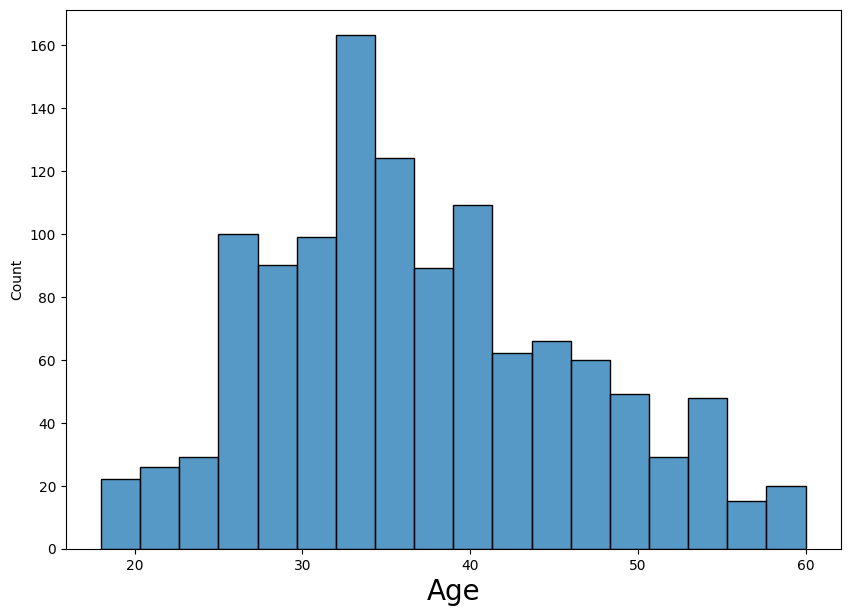

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(x='Age',data=data)
plt.xlabel('Age',fontsize=20)
plt.show()


The range of age between 18 to 60, most of the employee age between 25 to 40.   List item




**2] Employee Hourly Rate**

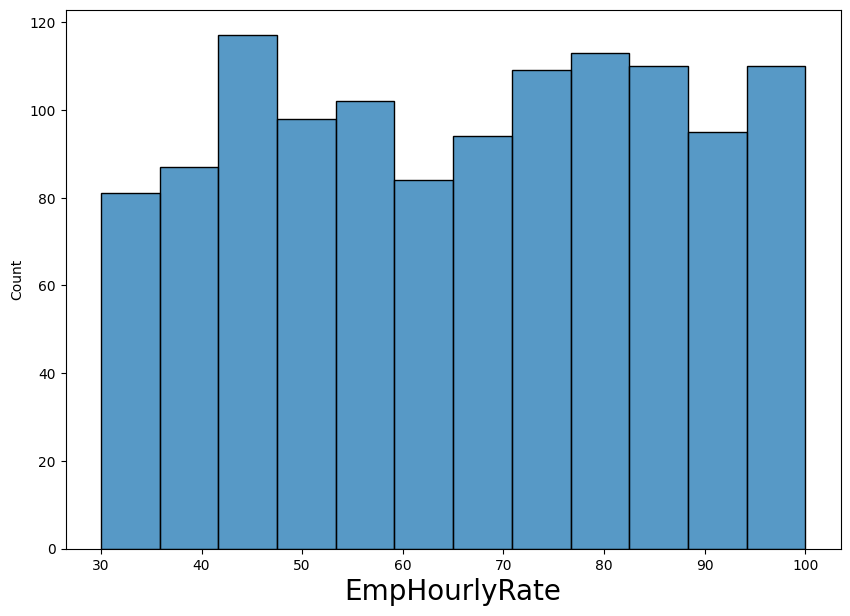

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(x='EmpHourlyRate',data=data)
plt.xlabel('EmpHourlyRate',fontsize=20)
plt.show()

**Observation**- The range of employee hourly rate between 30 to 100, most of the employee hourly rate is 45.

**3] Total Work Experience Year**

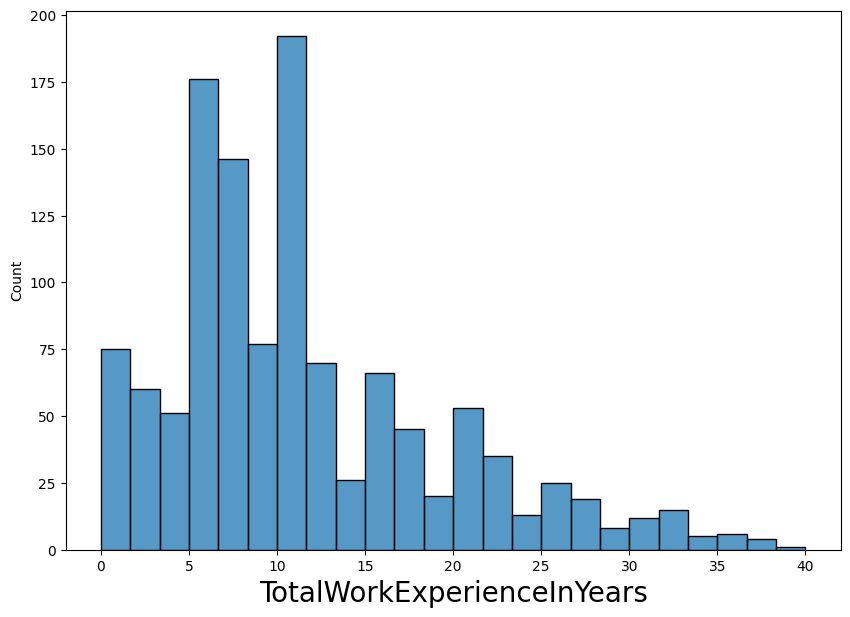

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(x='TotalWorkExperienceInYears',data=data)
plt.xlabel('TotalWorkExperienceInYears',fontsize=20)
plt.show()

**Observation** - Work experiance range between 0 to 40,Most of the employee experiance ranges between 5 to 10.

**4] Experience Years At This Company**

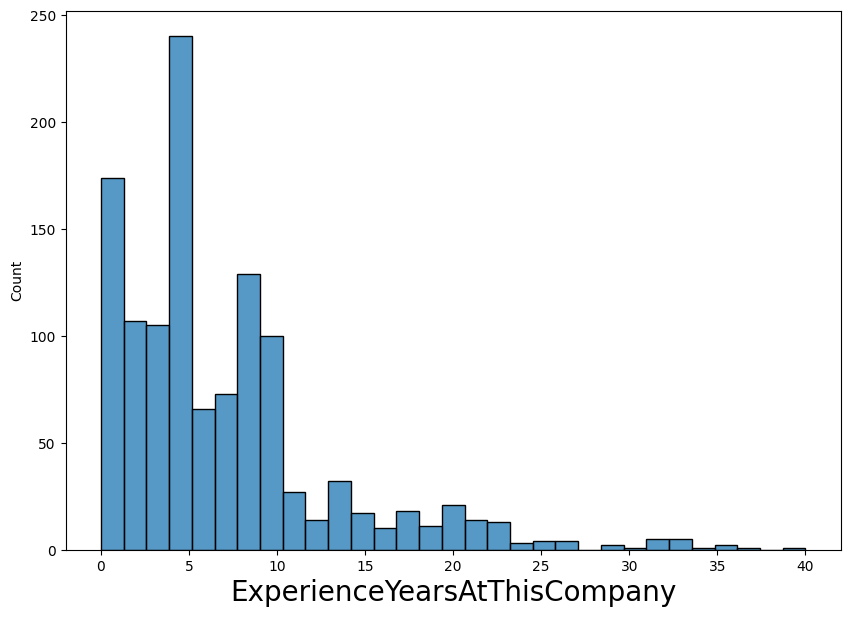

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(x='ExperienceYearsAtThisCompany',data=data)
plt.xlabel('ExperienceYearsAtThisCompany',fontsize=20)
plt.show()

**Observation**: The Range of experiance in same comapny is 0 to 40,most of the employee join between 0 to 5.

**USE SUBPLOT TO PLOTS MULTIPLE FEATURE**

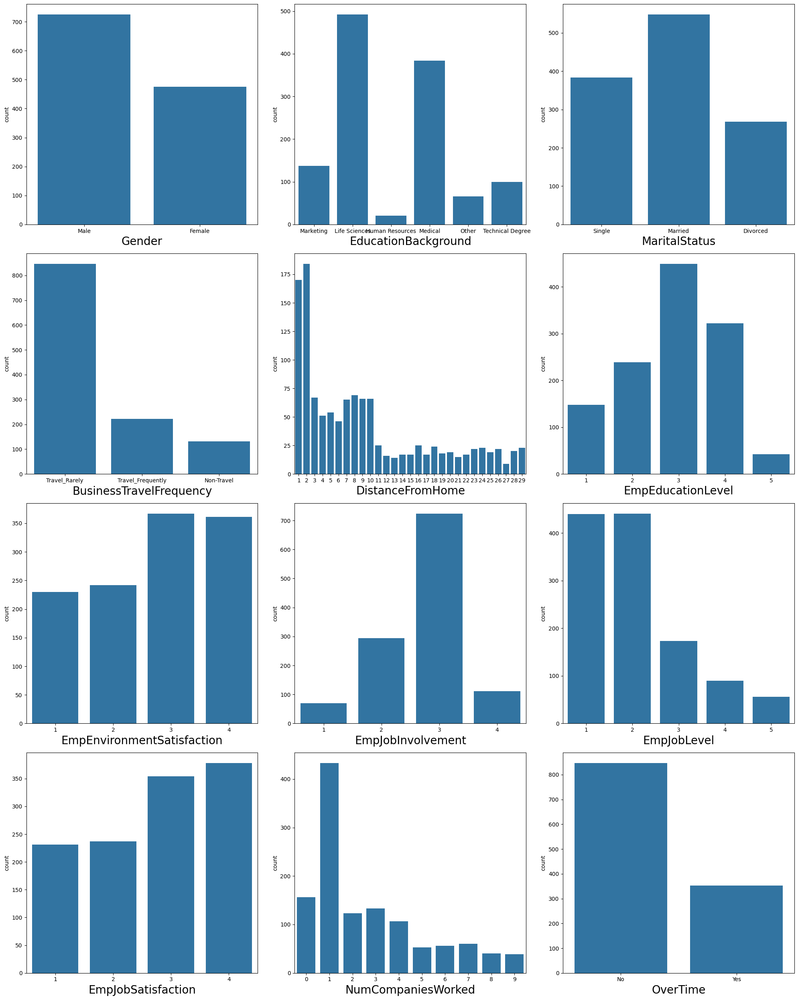

In [ ]:
count = data[['Gender', 'EducationBackground', 'MaritalStatus','BusinessTravelFrequency','DistanceFromHome',
              'EmpEducationLevel', 'EmpEnvironmentSatisfaction','EmpJobInvolvement', 'EmpJobLevel',
              'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime']] # making lsit of next 12 feature

plt.figure(figsize=(20,25)) # defining canvas size
plotno = 1 # counter

for column in count: # iteration of columns / acessing the columns from count
    if plotno<=13:    # set the limit
        plt.subplot(4,3,plotno) # # plotting 12 graphs (4-rows,3-columns) ,plotnumber is for count
        sns.countplot(x=count[column]) # Plotting count plots because the feature data type is discerte and categorical
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**5.Gender:**

Most of the male present in the comapany

**6.Education Background:**

Most of the education background of employee is Life science and medical, as well as marketing eduaction background employee is more than 100.
other eduacation background employee is less than 100.

**7.MaritalStatus:**

Most of the employee is married as well as less than 400 employee is single.
less than 300 employee mariatal status is divorced.

**8.Business Travel Frequency:**

Maximum no of employee travel rarely for company buisness purpose,less than 220 employee travel frequently remaining less than 120 employee not travell for buisness purpose.

**9.Distance From Home:**

The range of distance between home to comapny is 1 to 29.
Maximum no of employee home to company distance is less than 10.

**10.Educational Level:**

Total range of educational level is 1 to 5,Maximum no of employee education level is 3 & 4.2 education level employee is less than 250 and remianing 1 & 5 education level employee is less than 150.

**11.Employee Environment Satisfaction:**

Most of the employee Statisfaction is 3 & 4,1 & 2 enviroment satisfaction employee less than 250

**12.Employee Job Involvement:**

Most of the employee job involvement is 3 as well as 2 job involment employee is less than 300.Remaining 1 and 4 job involvment employee is less than 100.

**13.Employee Job Level:**

The range of employee job kevel is 1 to 5,most of the employee job level is 1 & 2.Minimum no of job level is 5, as well as 3 & 4 job level employee is less than 180.

**14.Employee Job Satisfaction:**

Most of the employee job satisfaction is 3 & 4 score as well as 1 & 2 score jon satisfaction employee is less than 250.

**15.Number Companies Worked:**

Maximum no of employee work with only one company.less no of employee work in more than 5 companies.

**16.Overtime:**

Most no of employee on doing over time and less than 350 employee doing overtime in company.

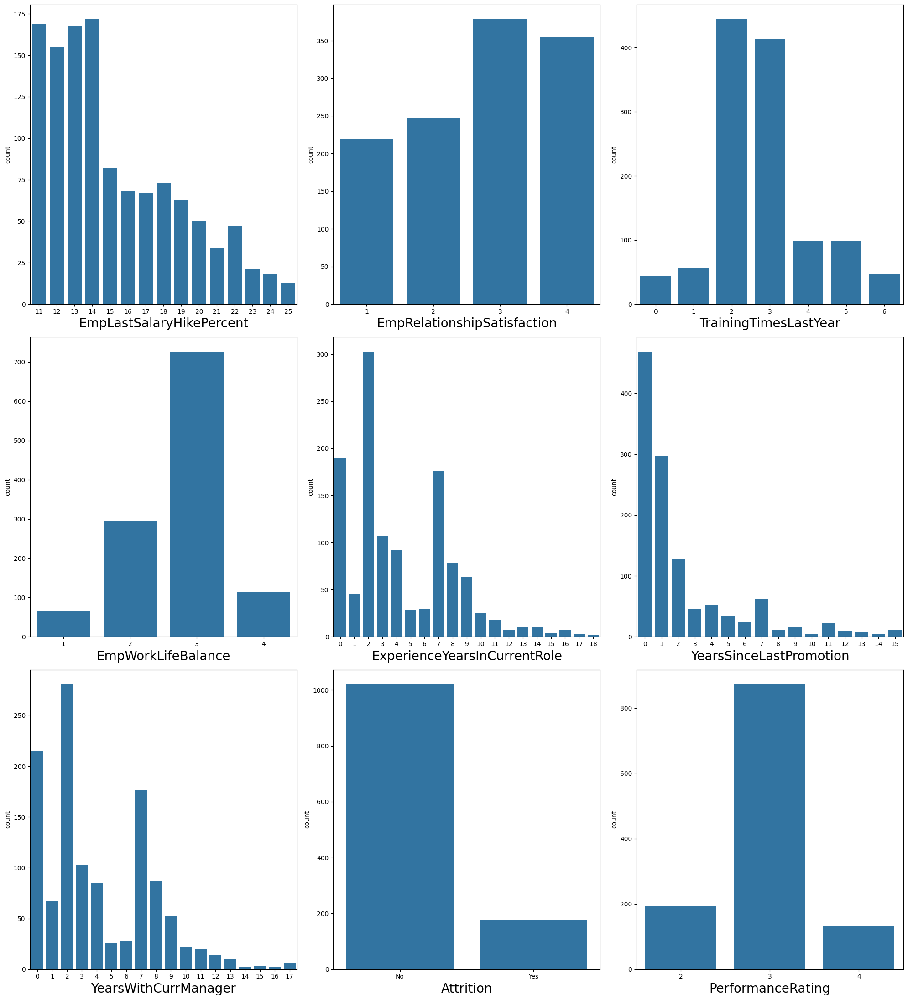

In [ ]:
count2 = data[['EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction','TrainingTimesLastYear','EmpWorkLifeBalance',
               'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager', 'Attrition',
               'PerformanceRating']]  #Making nex feature list to plot the graph

plt.figure(figsize=(20,22)) # defining canvas size
plotno = 1 # counter

for column in count2: # iteration of columns / acessing the columns from count
    if plotno<=10:    # set the limit
        plt.subplot(3,3,plotno) # # plotting 9 graphs (3-rows,3-columns) ,plotnumber is for count
        sns.countplot(x=count2[column]) # Plotting count plots because the feature data type is discerte and categorical
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**Observation**

**17.Employee Last Salary Hike Percent:**

Most no of employee salary hike percentage between 11 to 14%.total range of salary hike is 11 to 25,less than 80 employee last salary hike in between 15 to 19.

**18.Employee Relationship Satisfaction:**

The range of employee relationship satisfaction is 1 to 4,Most of the relation satisfaction is 3 & 4 as well as less than 250 employee with 1 & 2 relationship satisfaction.

**19.Training Times LastYear:**

The range of training time in last year between 0 to 6, Most of the employee doing 2 & 3 rd time training and remaining all times is less than 100.

**20.Employee Work Life Balance:**

Most most the work life balance is 3 than less than 300 employee work life balance is 2.

Minimum work life balance is 1 as well as less than 100 employee work life balance is 4.

**21.Experiance In Current Role:**

Maximum current role experiance of employee is 18.

Most of the employee have 2 years of expriance in current role then 7 year of experiance employee is less than 180,less than 200 employee have not current role experiance.

**22.Years Since Last Promotion:**

The range of year since last promotion is 0 to 15.
Most of the employee has not promoted in last year less than 300 employee has promoted atleast 1 year.

**23.Years With Current Manager:**

Most employee have 2 years with current manager and minimum 16 years with current manager.

The range in between 0 to 17 and less than 180 employee has 7 years with current manager.

**24.Attrition:**

Maximum no of employee has not leave the company and less than 200 employee has going to leave the company.

**25.Target Feature == Performance Rating:**

The range of performance rating is 2 to 4, most of the employee have 3 performance ranting and less performance rating is 4.
less than 200 employee has 2 performance rating.

**26] Employee Department**

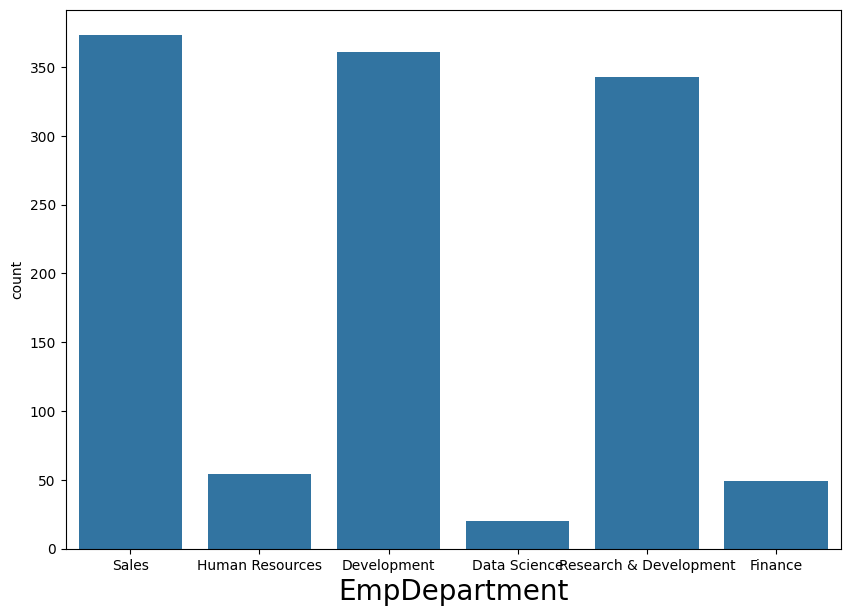

In [ ]:
plt.figure(figsize=(10,7))
sns.countplot(x='EmpDepartment',data=data)
plt.xlabel('EmpDepartment',fontsize=20)
plt.show()

**Observation**

Most of the employee from sales department as well as Development and research & Development departmnet employee is less than 320

Human resources & finance department employee is almost equal.
Data science employee has minimum in company.

**27] Employee Job Role**

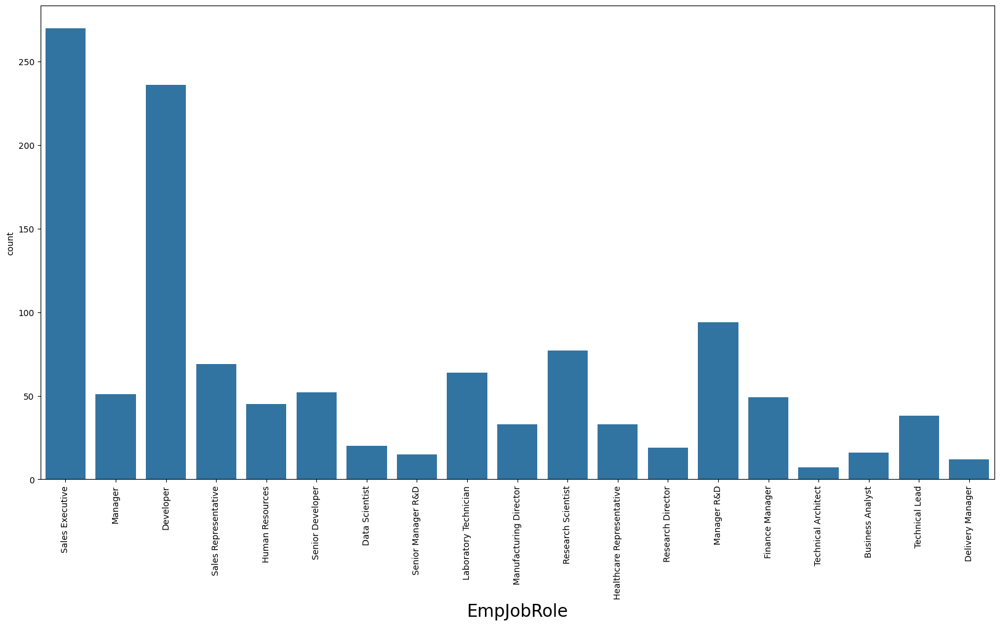

In [ ]:
plt.figure(figsize=(20,10))
sns.countplot(x='EmpJobRole',data=data)
plt.xticks(rotation='vertical')
plt.xlabel('EmpJobRole',fontsize=20)
plt.show()

**Observation**

Sales executive employee job role is maximum as well as Developer job role employee count is 230.

Manage R& D and research scientist employee is less than 100 and remaining all job role employee is less than 65.

**Bivariate Analysis**

**1.Relation Between Age & Experience Years At This Company**

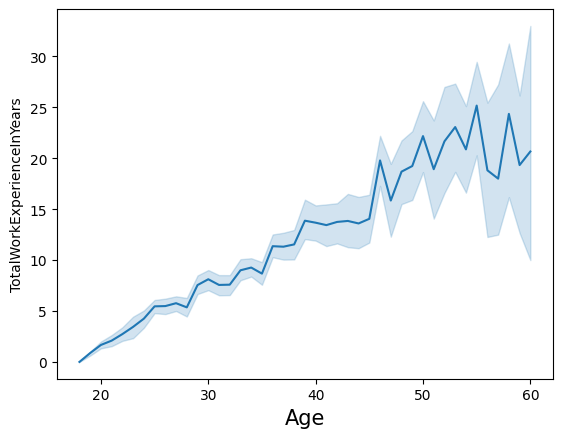

In [ ]:
sns.lineplot(x='Age',y='TotalWorkExperienceInYears',data=data)
plt.xlabel('Age',fontsize=15)
plt.show()


**Observation:**

If the age in between 18 to 25 then the total year of experiance is less than 5year.

If the age is increases that time experiance also increases.

**2.Relation Between experiance year at this company & total work experiance**

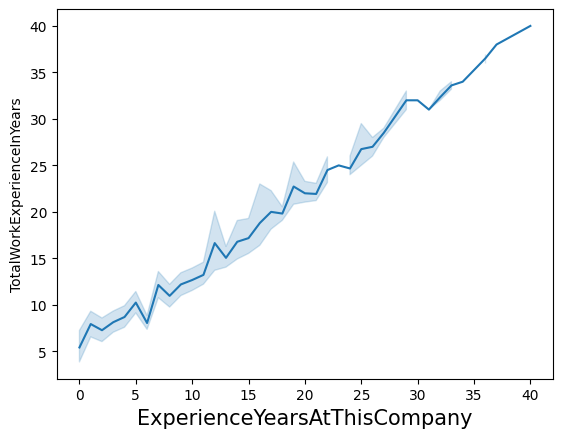

In [ ]:
sns.lineplot(x='ExperienceYearsAtThisCompany',y='TotalWorkExperienceInYears',data=data)
plt.xlabel('ExperienceYearsAtThisCompany',fontsize=15)
plt.show()

**Observation:**

If he experiance year at this company that time total work experiance also increases.

**3.Relation between Employee last salary hike and number of company worked**

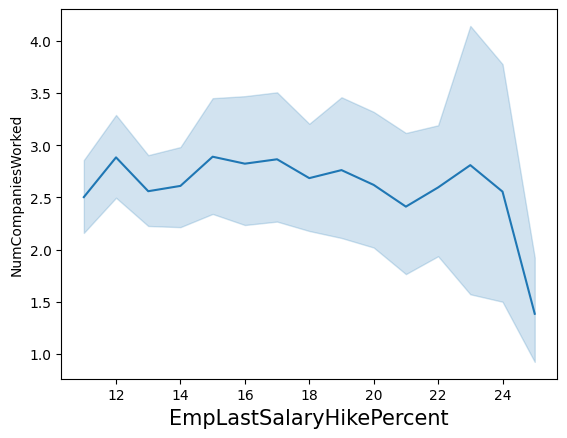

In [ ]:
sns.lineplot(x='EmpLastSalaryHikePercent',y='NumCompaniesWorked',data=data)
plt.xlabel('EmpLastSalaryHikePercent',fontsize=15)
plt.show()

**Observation:**

If the employee has work 1 or 2 company that time employee last salary hike percent is increases.

**4.Relation between Years Since Last Promotion and Experience Years In CurrentRole**

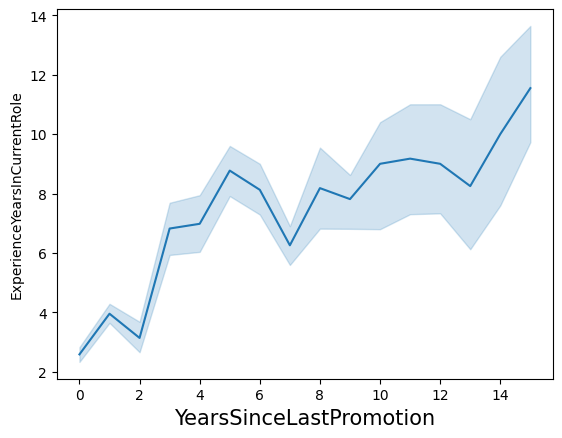

In [ ]:
sns.lineplot(x='YearsSinceLastPromotion',y='ExperienceYearsInCurrentRole',data=data)
plt.xlabel('YearsSinceLastPromotion',fontsize=15)
plt.show()

**Observation:**

In above plot clearly seen that year since last promotion is increases that time employee has more experiance with current role

**5.Relation between Employee Hourly Rate and Years With Current Manager**

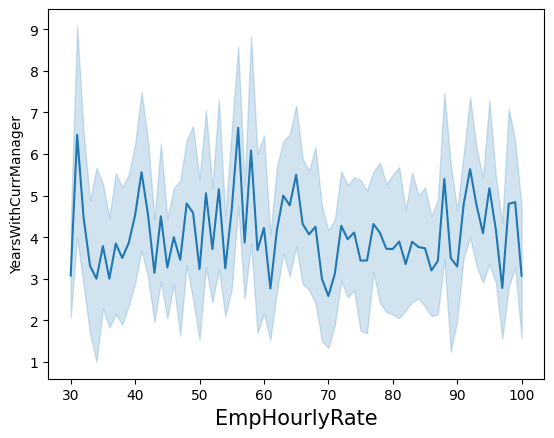

In [ ]:
sns.lineplot(x='EmpHourlyRate',y='YearsWithCurrManager',data=data)
plt.xlabel('EmpHourlyRate',fontsize=15)
plt.show()

**Observation:**

most of the employee hourly rate with their current manager is constant,but some of the employees has maximum hourly rate with less no of year with current manager.

**6.Relation between Distance From Home and Employee Last Salary Hike Percent**

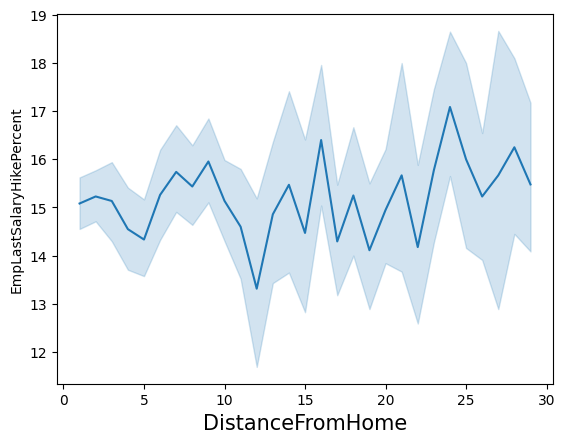

In [ ]:
sns.lineplot(x='DistanceFromHome',y='EmpLastSalaryHikePercent',data=data)
plt.xlabel('DistanceFromHome',fontsize=15)
plt.show()

**Observation:**

If the distance from home is more then the employee salary hike is slightly increases.
distance from home between 10 to 13 that time employee salary hike is decreases.

**ANALYSIS ON CATEGORICAL AND DISCERETE FEATURE**

**CREATE A NEW DATAFRAME FOR CATEGORICAL FEATURES.**

In [ ]:
categorical = []  # Create empty list to store the feature
for column in data.columns:
    if data[column].dtype == object:
        categorical.append(column)
        print(f"{column} : {data[column].unique()}")
        print("====================================")

EmpNumber : ['E1001000' 'E1001006' 'E1001007' ... 'E100994' 'E100995' 'E100998']
Gender : ['Male' 'Female']
EducationBackground : ['Marketing' 'Life Sciences' 'Human Resources' 'Medical' 'Other'
 'Technical Degree']
MaritalStatus : ['Single' 'Married' 'Divorced']
EmpDepartment : ['Sales' 'Human Resources' 'Development' 'Data Science'
 'Research & Development' 'Finance']
EmpJobRole : ['Sales Executive' 'Manager' 'Developer' 'Sales Representative'
 'Human Resources' 'Senior Developer' 'Data Scientist'
 'Senior Manager R&D' 'Laboratory Technician' 'Manufacturing Director'
 'Research Scientist' 'Healthcare Representative' 'Research Director'
 'Manager R&D' 'Finance Manager' 'Technical Architect' 'Business Analyst'
 'Technical Lead' 'Delivery Manager']
BusinessTravelFrequency : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
OverTime : ['No' 'Yes']
Attrition : ['No' 'Yes']


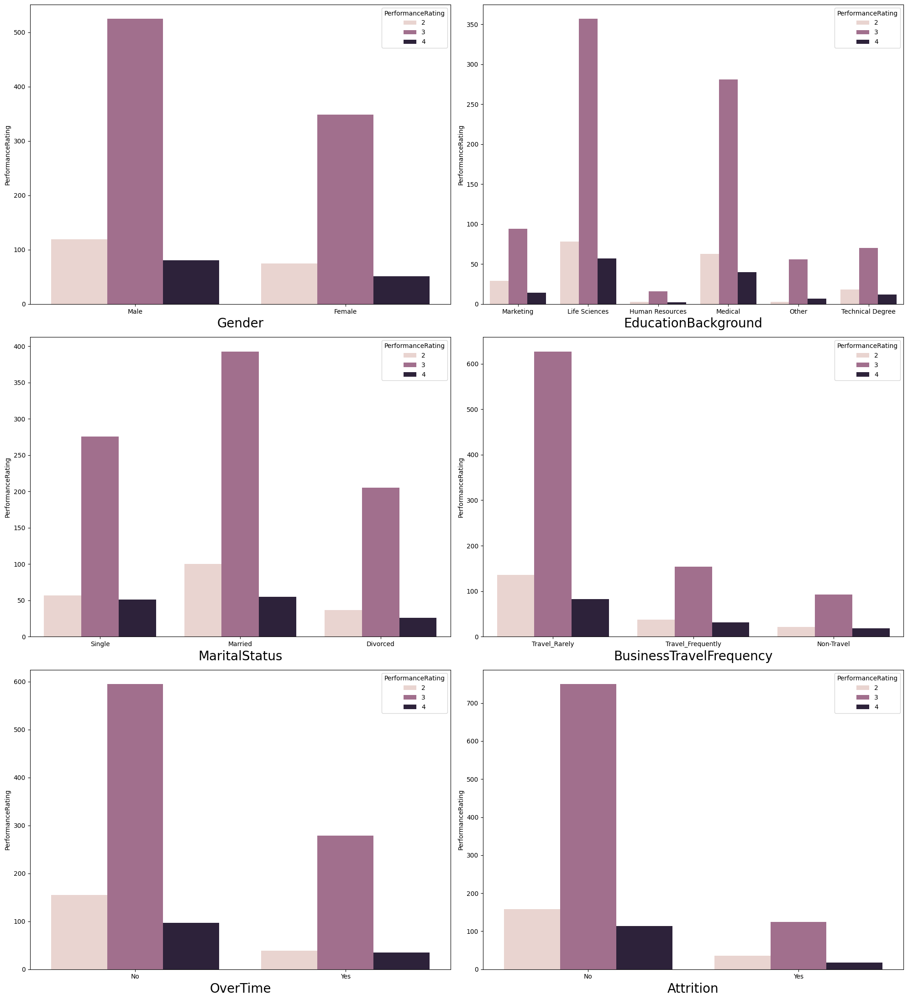

In [ ]:
# Make a list of categorical feature and use sub plot to plot multiple feature
categorical_col = data[['Gender','EducationBackground','MaritalStatus','BusinessTravelFrequency','OverTime','Attrition']]
plt.figure(figsize=(20,22)) # defining canvas size
plotno = 1 # counter

for column in categorical_col: # iteration of columns / acessing the columns from count
    if plotno<=7:    # set the limit
        plt.subplot(3,2,plotno) # # plotting 6 graphs (3-rows,2-columns) ,plotnumber is for count
        sns.countplot(x=categorical_col[column],hue=data.PerformanceRating) # Plotting count plots because the feature is categorical
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
        plt.ylabel('PerformanceRating')
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**Observations:**

**7. Relationship between Gender and performance rating**

Maximum no of male rated with 3 performance rating as well as in female also

most of the feamle rated with 3 performance rating.


four performance rating in both male & female is less

**8.Relationship between EducationBackground and performance rating**

Maximum life sciences and medical education background employee rated with 3 performance rating

life science and medical education background employee also rated with 2 & 4 performance rating most of the time

**9.Relationship between MaritalStatus and performance rating**

Most of the married employee rated with 3 performance rating as well as single and divorced marital status employee rated with 3 performance rating most of the time.

In married marital status 2 performance rating emplyee is more than single or divorced.

**10.Relationship between Business Travel Frequency and performance rating**

Maximum no of travel rarely employee has get 3 performance rating

Those employee travel frequentaly this employee also rated with 2, 3, and 4

**11.Relationship between Overtime and performance rating**

Maximum no of employee with no overtime has rated with 3 perfomance rating

Those employee doing overtime that time 2 & 4 performance rating is constant.

**12.Relationship between Attrition and performance rating**

Most of the employee rated with 3 performance rating in no means(They are not leave the company)

Those employee have 3 performace rating those also leave the company

**CREATE NEW DATAFRMAE FOR NUMERICAL FEATURES:**

In [ ]:
numerical_col = []
for column in data.columns:
    if data[column].dtype == "int64":
        data[column].unique()   # for continuos features we use unique>=10
        numerical_col.append(column)

In [ ]:
numerical_col  # All numerical features


['Age',
 'DistanceFromHome',
 'EmpEducationLevel',
 'EmpEnvironmentSatisfaction',
 'EmpHourlyRate',
 'EmpJobInvolvement',
 'EmpJobLevel',
 'EmpJobSatisfaction',
 'NumCompaniesWorked',
 'EmpLastSalaryHikePercent',
 'EmpRelationshipSatisfaction',
 'TotalWorkExperienceInYears',
 'TrainingTimesLastYear',
 'EmpWorkLifeBalance',
 'ExperienceYearsAtThisCompany',
 'ExperienceYearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'PerformanceRating']

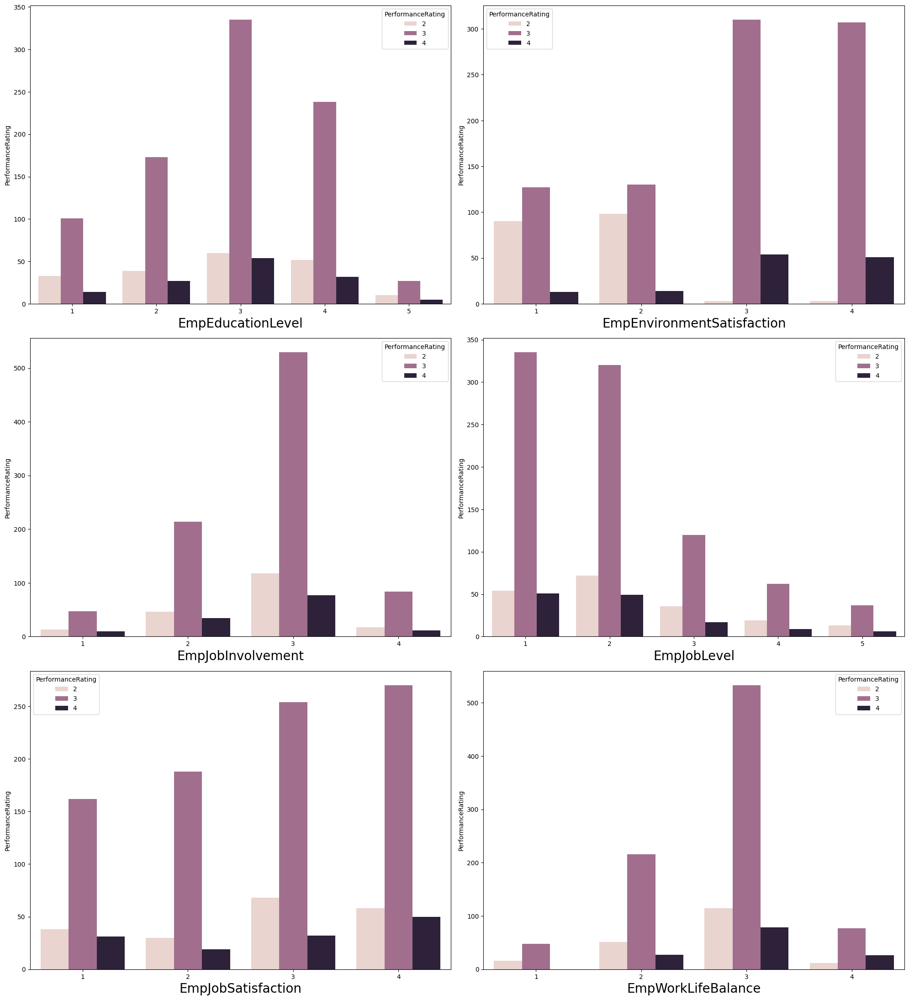

In [ ]:
numerical = data[['EmpEducationLevel','EmpEnvironmentSatisfaction','EmpJobInvolvement','EmpJobLevel','EmpJobSatisfaction',
                 'EmpWorkLifeBalance']]

plt.figure(figsize=(20,22)) # defining canvas size
plotno = 1 # counter

for column in numerical: # iteration of columns / acessing the columns from count
    if plotno<=7:    # set the limit
        plt.subplot(3,2,plotno) # # plotting 6 graphs (3-rows,2-columns) ,plotnumber is for count
        sns.countplot(x=numerical[column],hue=data.PerformanceRating) # Plotting count plots because the feature is categorical
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
        plt.ylabel('PerformanceRating')
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**Observations:**
7. Relationship between Gender and performance rating

Maximum no of male rated with 3 performance rating as well as in female also most of the feamle rated with 3 performance rating.
four performance rating in both male & female is less

**8.Relationship between EducationBackground and performance rating**

Maximum life sciences and medical education background employee rated with 3 performance rating

life science and medical education background employee also rated with 2 & 4 performance rating most of the time

**9.Relationship between MaritalStatus and performance rating**

Most of the married employee rated with 3 performance rating as well as single and divorced marital status employee rated with 3 performance rating most of the time.

In married marital status 2 performance rating emplyee is more than single or divorced.

**10.Relationship between Business Travel Frequency and performance rating**

Maximum no of travel rarely employee has get 3 performance rating

Those employee travel frequentaly this employee also rated with 2, 3, and 4

**11.Relationship between Overtime and performance rating**

Maximum no of employee with no overtime has rated with 3 perfomance rating

Those employee doing overtime that time 2 & 4 performance rating is constant.

**12.Relationship between Attrition and performance rating**

Most of the employee rated with 3 performance rating in no means(They are not leave the company)

Those employee have 3 performace rating those also leave the company

**Relationship between employee department and performance rating**

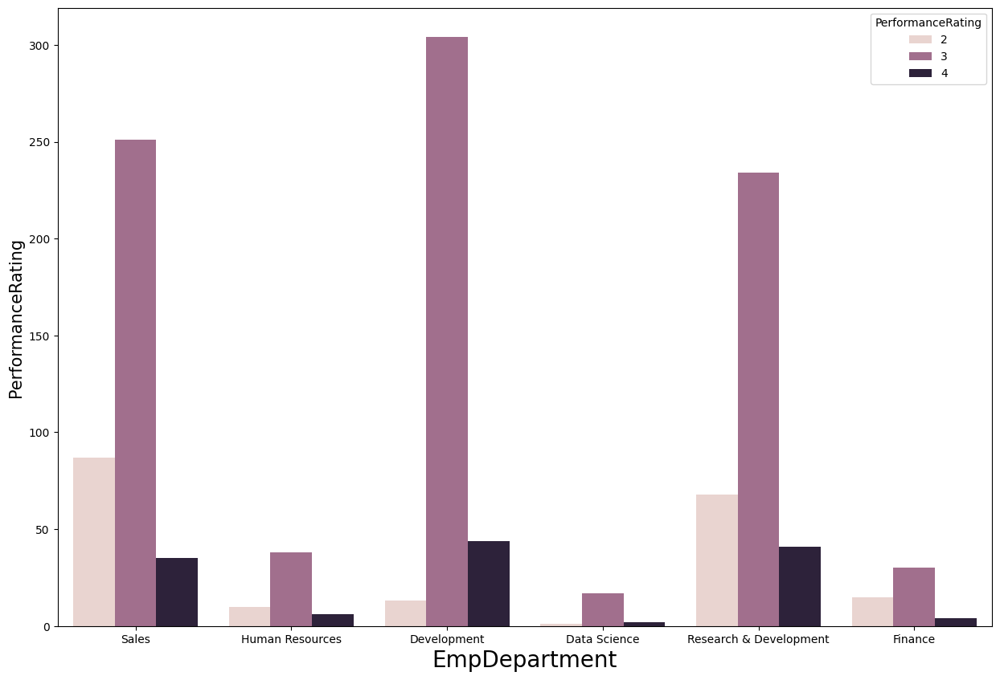

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(x='EmpDepartment',hue=data.PerformanceRating,data=data)
plt.xlabel('EmpDepartment',fontsize=20)
plt.ylabel('PerformanceRating',fontsize=15)
plt.show()

**Observation:**

Most of the Development, Sales, And Research and development employee department has 3 peformance rating

Data science department employee has low performance rating.

In sales & Research and development department also 2 performance rating employee avilable most of the time.

**Relationship between employee job role and performance rating**

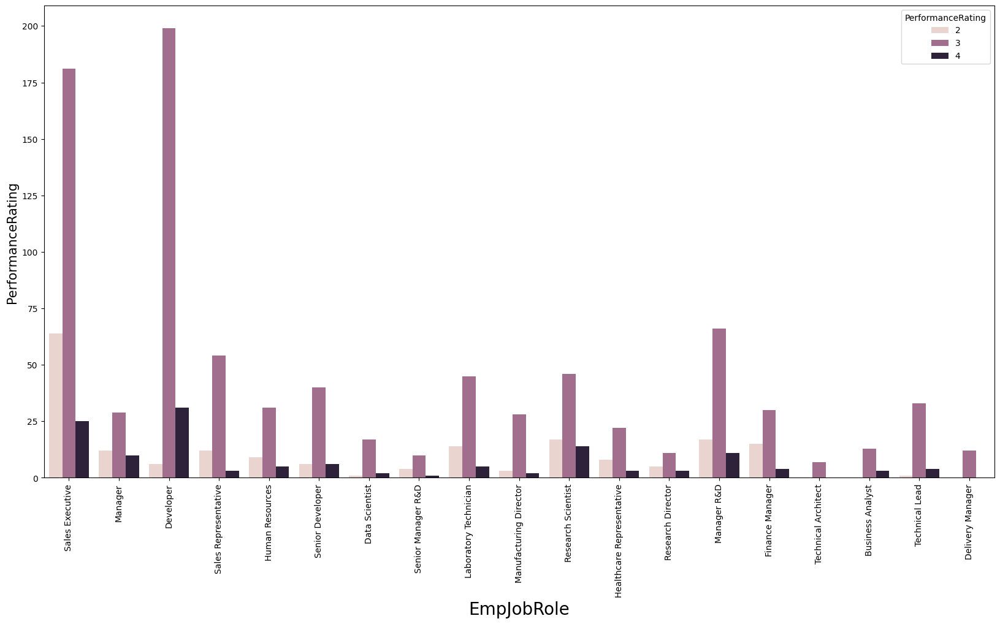

In [ ]:
plt.figure(figsize=(20,10))
sns.countplot(x='EmpJobRole',hue=data.PerformanceRating,data=data)
plt.xticks(rotation='vertical')
plt.xlabel('EmpJobRole',fontsize=20)
plt.ylabel('PerformanceRating',fontsize=15)
plt.show()

**Observation:**

Developers and sales executive job role employee performance rating is 3 most of the time.

In technical architecture and delivery manger job role employee not rated with 2 & 4 performance rating.

In sales excutive alsso less than 60 employee rated with 2 performance rating.
Remaining all job role employee has 3 performance rating most of the time.

**Multivariate Analysis**

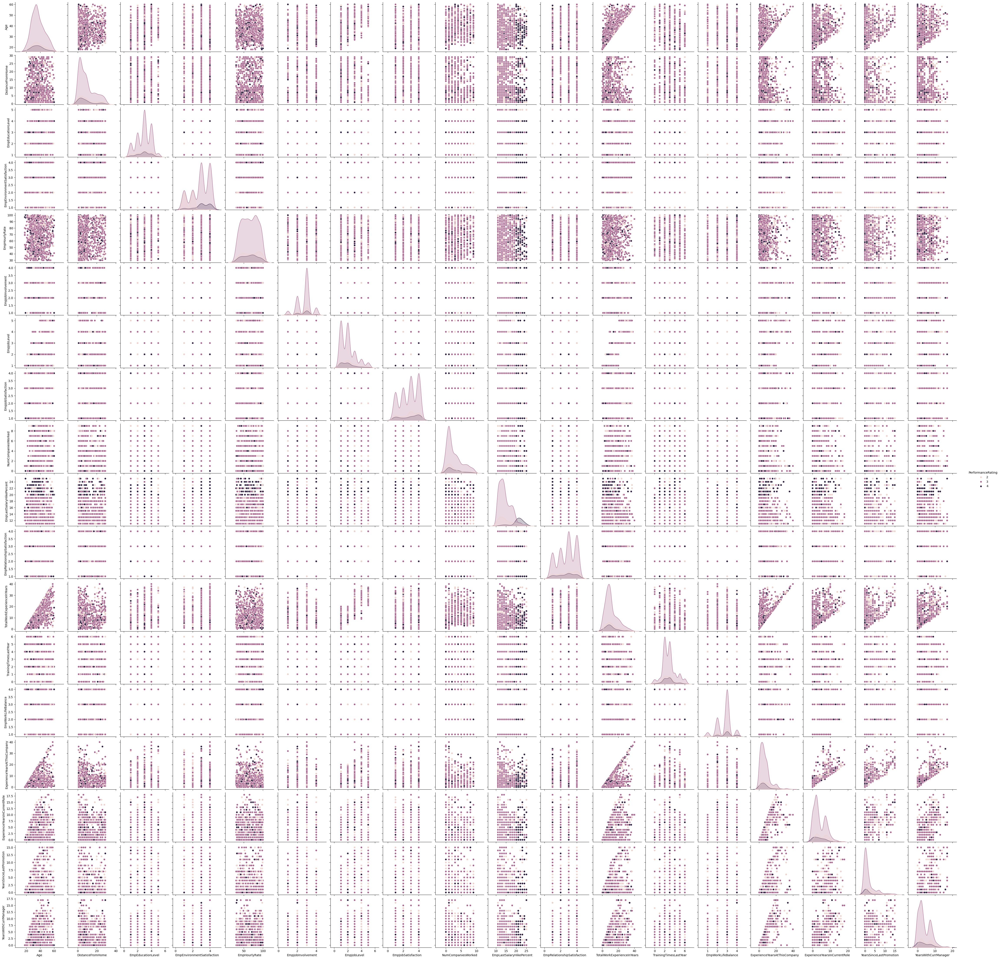

In [ ]:
sns.pairplot(data,hue='PerformanceRating')
plt.show()

**DATA PRE-PROCESSING & FEATURE SELECTION:**

**DATA PRE-PROCESSING SUMMARY:**


**Checking Missing Value**

In [ ]:
data.isnull().sum()

,0
EmpNumber,0
Age,0
Gender,0
EducationBackground,0
MaritalStatus,0
EmpDepartment,0
EmpJobRole,0
BusinessTravelFrequency,0
DistanceFromHome,0
EmpEducationLevel,0


**There is no missing value**

**Convert Categorical COlumn into numeric**

In [ ]:
# Get all categorical feature list
list(data.select_dtypes('object'))

['EmpNumber',
 'Gender',
 'EducationBackground',
 'MaritalStatus',
 'EmpDepartment',
 'EmpJobRole',
 'BusinessTravelFrequency',
 'OverTime',
 'Attrition']


**Technique Used:**

1.Mannual Encoding: Mannual encoding is a best techinque to handel categorical feature with the help of map function, map the labels based on frequency.

2.Frequency Encoding: Frequency encoding is an encoding technique to transform an original categorical variable to a numerical variable by considering the frequency distribution of the data getting value counts.

**1.Gender:**

In [ ]:
# Get value counts of gender
data.Gender.value_counts()

,count
Gender,
Male,725
Female,475


In [ ]:
# Use mannual encoding to map the labels
data.Gender = data.Gender.map({'Male':1,'Female':0})

**2.Education Background**

In [ ]:
# Get value counts of Education Background
data.EducationBackground.value_counts()

,count
EducationBackground,
Life Sciences,492
Medical,384
Marketing,137
Technical Degree,100
Other,66
Human Resources,21


In [ ]:
# Use frequency encoding
data.loc[data['EducationBackground']=='Life Sciences','EducationBackground']=5
data.loc[data['EducationBackground']=='Medical','EducationBackground']=4
data.loc[data['EducationBackground']=='Marketing','EducationBackground']=3
data.loc[data['EducationBackground']=='Technical Degree','EducationBackground']=2
data.loc[data['EducationBackground']=='Other','EducationBackground']=1
data.loc[data['EducationBackground']=='Human Resources','EducationBackground']=0

In [ ]:

# Checking conversion happen or not
data.EducationBackground.value_counts()

,count
EducationBackground,
5,492
4,384
3,137
2,100
1,66
0,21


**3.Marital Status**

In [ ]:
# Get the value counts of marital status
data.MaritalStatus.value_counts()

,count
MaritalStatus,
Married,548
Single,384
Divorced,268


In [ ]:
data.MaritalStatus = data.MaritalStatus.map({'Married':2,'Single':1,'Divorced':0})


In [ ]:
# Check conversion happen or not
data.MaritalStatus.value_counts()

,count
MaritalStatus,
2,548
1,384
0,268


**4.Employee Department**

In [ ]:
# Get the value counts of employee department
data.EmpDepartment.value_counts()

,count
EmpDepartment,
Sales,373
Development,361
Research & Development,343
Human Resources,54
Finance,49
Data Science,20


In [ ]:
# Use Frequency encoding
data.loc[data['EmpDepartment']=='Sales','EmpDepartment']=5
data.loc[data['EmpDepartment']=='Development','EmpDepartment']=4
data.loc[data['EmpDepartment']=='Research & Development','EmpDepartment']=3
data.loc[data['EmpDepartment']=='Human Resources','EmpDepartment']=2
data.loc[data['EmpDepartment']=='Finance','EmpDepartment']=1
data.loc[data['EmpDepartment']=='Data Science','EmpDepartment']=0

In [ ]:
# Check conversion happen or not
data.EmpDepartment.value_counts()

,count
EmpDepartment,
5,373
4,361
3,343
2,54
1,49
0,20


**5.Employee Job Role**

In [ ]:
data.EmpJobRole.value_counts()


,count
EmpJobRole,
Sales Executive,270
Developer,236
Manager R&D,94
Research Scientist,77
Sales Representative,69
Laboratory Technician,64
Senior Developer,52
Manager,51
Finance Manager,49


In [ ]:
# Use frequency encoding because feature contain a lots of label
data.loc[data['EmpJobRole']=='Sales Executive','EmpJobRole']=18
data.loc[data['EmpJobRole']=='Developer','EmpJobRole']=17
data.loc[data['EmpJobRole']=='Manager R&D','EmpJobRole']=16
data.loc[data['EmpJobRole']=='Research Scientist','EmpJobRole']=15
data.loc[data['EmpJobRole']=='Sales Representative','EmpJobRole']=14
data.loc[data['EmpJobRole']=='Laboratory Technician','EmpJobRole']=13
data.loc[data['EmpJobRole']=='Senior Developer','EmpJobRole']=12
data.loc[data['EmpJobRole']=='Manager','EmpJobRole']=11
data.loc[data['EmpJobRole']=='Finance Manager','EmpJobRole']=10
data.loc[data['EmpJobRole']=='Human Resources','EmpJobRole']=9
data.loc[data['EmpJobRole']=='Technical Lead','EmpJobRole']=8
data.loc[data['EmpJobRole']=='Manufacturing Director','EmpJobRole']=7
data.loc[data['EmpJobRole']=='Healthcare Representative','EmpJobRole']=6
data.loc[data['EmpJobRole']=='Data Scientist','EmpJobRole']=5
data.loc[data['EmpJobRole']=='Research Director','EmpJobRole']=4
data.loc[data['EmpJobRole']=='Business Analyst','EmpJobRole']=3
data.loc[data['EmpJobRole']=='Senior Manager R&D','EmpJobRole']=2
data.loc[data['EmpJobRole']=='Delivery Manager','EmpJobRole']=1
data.loc[data['EmpJobRole']=='Technical Architect','EmpJobRole']=0

In [ ]:
# Check conversion happen or not
data.EmpJobRole.value_counts()

,count
EmpJobRole,
18,270
17,236
16,94
15,77
14,69
13,64
12,52
11,51
10,49


**6.Business Travel Frequency:**

In [ ]:
# Get the value count of buisness travel frequency
data.BusinessTravelFrequency.value_counts()

,count
BusinessTravelFrequency,
Travel_Rarely,846
Travel_Frequently,222
Non-Travel,132


In [ ]:
data.BusinessTravelFrequency = data.BusinessTravelFrequency.map({'Travel_Rarely':2,'Travel_Frequently':1,'Non-Travel':0})


In [ ]:
# Check conversion happen or not
data.BusinessTravelFrequency.value_counts()

,count
BusinessTravelFrequency,
2,846
1,222
0,132


**7.Overtime:**

In [ ]:
# Get the value count of Overtime
data.OverTime.value_counts()

,count
OverTime,
No,847
Yes,353


In [ ]:
# Use mannual Encoding
data.OverTime = data.OverTime.map({'No':1,'Yes':0})

**8.Attrition**

In [ ]:
# Get the value counts of Attrition
data.Attrition.value_counts()

,count
Attrition,
No,1022
Yes,178


In [ ]:
# Use Mannual encoding because feature contain less no of label
data.Attrition = data.Attrition.map({'No':1,'Yes':0})

In [ ]:
# Check conversion happen or not
data.Attrition.value_counts()

,count
Attrition,
1,1022
0,178


In [ ]:
# Check all data features
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,1,3,1,5,18,2,10,3,4,55,3,2,4,1,1,12,4,10,2,2,10,7,0,8,1,3
1,E1001006,47,1,3,1,5,18,2,14,4,4,42,3,2,1,2,1,12,4,20,2,3,7,7,1,7,1,3
2,E1001007,40,1,5,2,5,18,1,5,4,4,48,2,3,1,5,0,21,3,20,2,3,18,13,1,12,1,4
3,E1001009,41,1,0,0,2,11,2,10,4,2,73,2,5,4,3,1,15,2,23,2,2,21,6,12,6,1,3
4,E1001010,60,1,3,1,5,18,2,16,4,1,84,3,2,1,8,1,14,4,10,1,3,2,2,2,2,1,3


**CHECK OUTLIERS AND IMPUTE OUTLIERS:**

**BoxPlot**: Box plots are used to show distributions of numeric data values as well as it helps to detect the outliers.

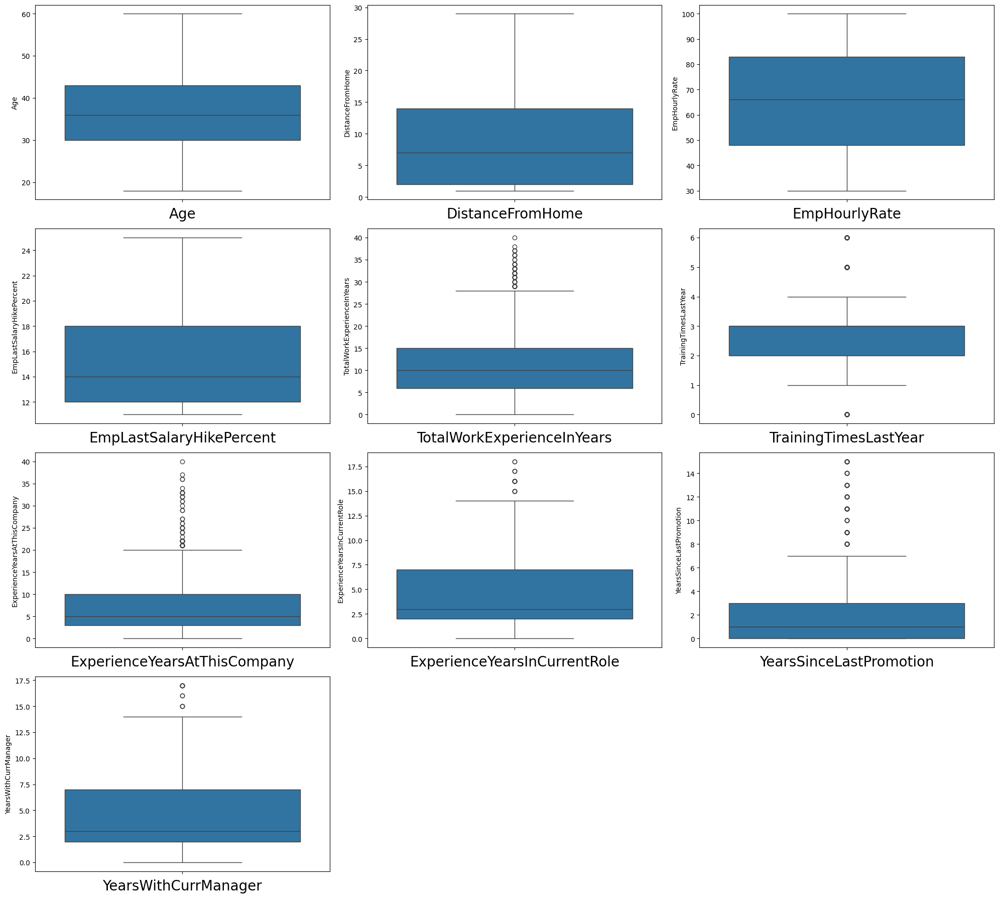

In [ ]:
out = data[['Age','DistanceFromHome','EmpHourlyRate','EmpLastSalaryHikePercent',
                   'TotalWorkExperienceInYears','TrainingTimesLastYear','ExperienceYearsAtThisCompany',
                   'ExperienceYearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']]

plt.figure(figsize=(20,18)) # defining canvas size
plotno = 1 # counter

for column in out: # iteration of columns / acessing the columns from count
    if plotno<=12:    # set the limit
        plt.subplot(4,3,plotno) # # plotting 7 graphs (3-rows,3-columns) ,plotnumber is for count
        sns.boxplot(out[column]) # Plotting box plots to detect the outlier
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**IQR**

IQR stand for the interquatile range, When a data set has outliers or extreme values, we summarize a typical value using the median as opposed to the mean. which is the difference between the first and third quartiles

**1.Total Work Experiance in year**

In [ ]:
import scipy.stats as stats
# Use iqr range because some skewed in data
iqr = stats.iqr(data['TotalWorkExperienceInYears'],interpolation='midpoint')
print("IQR:",iqr)

# Getting first & third quantile
Q1 = data['TotalWorkExperienceInYears'].quantile(0.25)
Q3 = data['TotalWorkExperienceInYears'].quantile(0.75)

# Get maximum and minimum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 + 1.5*iqr
print("Maximum Limit:",max_limit)

IQR: 9.0
Minimum limit: -7.5
Maximum Limit: 28.5


In [ ]:
# Impute outlier
data.loc[data['TotalWorkExperienceInYears'] > max_limit,'TotalWorkExperienceInYears']=data['TotalWorkExperienceInYears'].median()

In [ ]:
# filtering data after imputation
data.loc[data['TotalWorkExperienceInYears'] > max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**2.Training Times Last Year**

In [ ]:
# Use iqr range because some skewed in data
iqr = stats.iqr(data['TrainingTimesLastYear'],interpolation='midpoint')
print("IQR:",iqr)

# Getting first & third quantile
Q1 = data['TrainingTimesLastYear'].quantile(0.25)
Q3 = data['TrainingTimesLastYear'].quantile(0.75)

# Get maximum and minimum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 + 1.5*iqr
print("Maximum Limit:",max_limit)

IQR: 1.0
Minimum limit: 0.5
Maximum Limit: 4.5


In [ ]:
# Impute outlier in max & minmum limit
data.loc[data['TrainingTimesLastYear'] < min_limit,'TrainingTimesLastYear']=data['TrainingTimesLastYear'].median()
data.loc[data['TrainingTimesLastYear'] > max_limit,'TrainingTimesLastYear']=data['TrainingTimesLastYear'].median()

In [ ]:
# Filtering the min limit
data.loc[data['TrainingTimesLastYear'] < min_limit]


,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


In [ ]:
data.loc[data['TrainingTimesLastYear'] > max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**3.Experience Years At This Company**

In [ ]:
# Use iqr range because some skewed in data
iqr = stats.iqr(data['ExperienceYearsAtThisCompany'],interpolation='midpoint')
print("IQR:",iqr)

# Getting first & third quantile
Q1 = data['ExperienceYearsAtThisCompany'].quantile(0.25)
Q3 = data['ExperienceYearsAtThisCompany'].quantile(0.75)

# Get maximum and minimum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 + 1.5*iqr
print("Maximum Limit:",max_limit)

IQR: 7.0
Minimum limit: -7.5
Maximum Limit: 20.5


In [ ]:
# Impute outlier
data.loc[data['ExperienceYearsAtThisCompany'] > max_limit,'ExperienceYearsAtThisCompany']=data['ExperienceYearsAtThisCompany'].median()

In [ ]:

# Filtering the data
data.loc[data['ExperienceYearsAtThisCompany'] > max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**4.Experience Years In Current Role**

In [ ]:
# Use iqr range because some skewed in data
iqr = stats.iqr(data['ExperienceYearsInCurrentRole'],interpolation='midpoint')
print("IQR:",iqr)

# Getting first & third quantile
Q1 = data['ExperienceYearsInCurrentRole'].quantile(0.25)
Q3 = data['ExperienceYearsInCurrentRole'].quantile(0.75)

# Get maximum and minimum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 + 1.5*iqr
print("Maximum Limit:",max_limit)

IQR: 5.0
Minimum limit: -5.5
Maximum Limit: 14.5


In [ ]:
data.loc[data['ExperienceYearsInCurrentRole'] > max_limit,'ExperienceYearsInCurrentRole'] = data['ExperienceYearsInCurrentRole'].median()


In [ ]:
data.loc[data['ExperienceYearsInCurrentRole'] > max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**5.Years Since Last Promotion**

In [ ]:
# use iqr because some skewed in data
iqr = stats.iqr(data['YearsSinceLastPromotion'],interpolation='midpoint')
print("IQR:",iqr)

# Get first and third quantile
Q1 = data['YearsSinceLastPromotion'].quantile(0.25)
Q3 = data['YearsSinceLastPromotion'].quantile(0.75)

# Get manimum and maximum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 +1.5*iqr
print("Maximum limit",max_limit)

IQR: 3.0
Minimum limit: -4.5
Maximum limit 7.5


In [ ]:
# impute outlier
data.loc[data['YearsSinceLastPromotion'] > max_limit,'YearsSinceLastPromotion']=data['YearsSinceLastPromotion'].median()

In [ ]:
# Filtering data
data.loc[data['YearsSinceLastPromotion'] > max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**6.Years With Current Manager**

In [ ]:
# use iqr because some skewed in data
iqr = stats.iqr(data['YearsWithCurrManager'],interpolation='midpoint')
print("IQR:",iqr)

# Get first and third quantile
Q1 = data['YearsWithCurrManager'].quantile(0.25)
Q3 = data['YearsWithCurrManager'].quantile(0.75)

# Get manimum and maximum limit
min_limit = Q1 - 1.5*iqr
print("Minimum limit:",min_limit)

max_limit = Q3 +1.5*iqr
print("Maximum limit",max_limit)

IQR: 5.0
Minimum limit: -5.5
Maximum limit 14.5


In [ ]:
# impute outlier
data.loc[data['YearsWithCurrManager'] > max_limit,'YearsWithCurrManager']=data['YearsWithCurrManager'].median()

In [ ]:
# Filtering the data
data.loc[data['YearsWithCurrManager'] >max_limit]

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating


**CHECKING OUTLIER AFTER IMPUTATION**

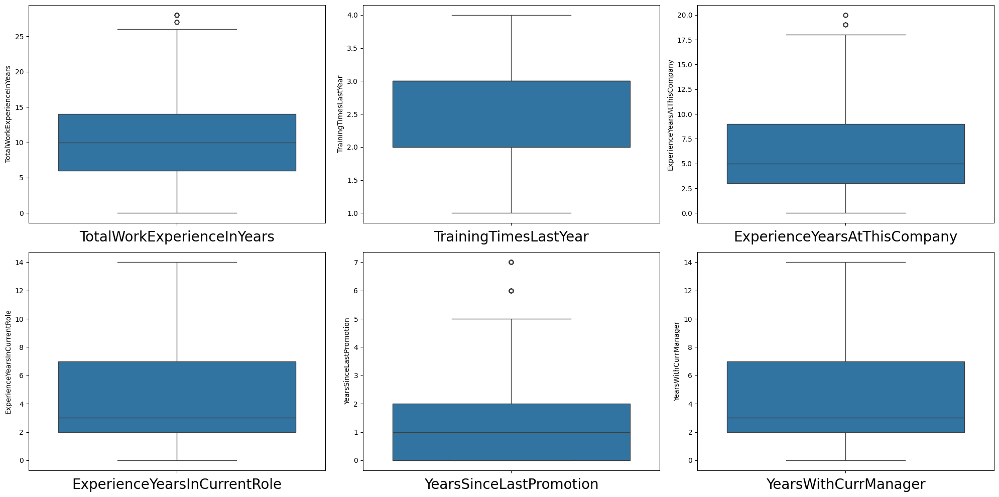

In [ ]:
out = data[['TotalWorkExperienceInYears','TrainingTimesLastYear','ExperienceYearsAtThisCompany',
            'ExperienceYearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']]

plt.figure(figsize=(20,10)) # defining canvas size
plotno = 1 # counter

for column in out: # iteration of columns / acessing the columns from count
    if plotno<=7:    # set the limit
        plt.subplot(2,3,plotno) # # plotting 7 graphs (3-rows,3-columns) ,plotnumber is for count
        sns.boxplot(out[column]) # Plotting box plots to detect the outlier
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

**SCALING THE DATA**

**Standard Scaling**: Standardization is the process of scaling the feature, it assumes the feature follow normal distribution and scale the feature between mean and standard deviation, here mean is 0 and standard deviation is always 1.

In [ ]:
from sklearn.preprocessing import StandardScaler

scalar = StandardScaler()  #Create Object

data[['Age','DistanceFromHome','EmpHourlyRate','EmpLastSalaryHikePercent','TotalWorkExperienceInYears',
      'TrainingTimesLastYear','ExperienceYearsAtThisCompany','ExperienceYearsInCurrentRole','YearsWithCurrManager',
      'YearsSinceLastPromotion']]=scalar.fit_transform(data[['Age','DistanceFromHome','EmpHourlyRate',
      'EmpLastSalaryHikePercent','TotalWorkExperienceInYears','TrainingTimesLastYear','ExperienceYearsAtThisCompany',
      'ExperienceYearsInCurrentRole','YearsWithCurrManager','YearsSinceLastPromotion']])

In [ ]:
data.head()

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,-0.541458,1,3,1,5,18,2,0.102061,3,4,-0.543569,3,2,4,1,1,-0.889111,4,-0.058535,-0.879579,2,0.868276,0.864098,-0.756553,1.202103,1,3
1,E1001006,1.109888,1,3,1,5,18,2,0.591464,4,4,-1.187042,3,2,1,2,1,-0.889111,4,1.512870,-0.879579,3,0.200371,0.864098,-0.234492,0.902825,1,3
2,E1001007,0.339260,1,5,2,5,18,1,-0.509693,4,4,-0.890055,2,3,1,5,0,1.594054,3,1.512870,-0.879579,3,2.649355,2.661702,-0.234492,2.399219,1,4
3,E1001009,0.449349,1,0,0,2,11,2,0.102061,4,2,0.347393,2,5,4,3,1,-0.061389,2,1.984292,-0.879579,2,-0.244898,0.564498,-0.234492,0.603546,1,3
4,E1001010,2.541054,1,3,1,5,18,2,0.836165,4,1,0.891870,3,2,1,8,1,-0.337297,4,-0.058535,-2.303999,3,-0.912803,-0.633905,0.287569,-0.593570,1,3


**FEATURE SELECTION**

In [ ]:
# Dropping employee number because this is a constant column as well as drop Years Since Last Promotion because we create a new feaure using square root tr
data.drop(['EmpNumber','YearsSinceLastPromotion'],axis=1,inplace=True)

**CHECKING CORELATION**

**Heatmap**: A heatmap is a graphical representation of data that uses a system of color-coding to represent different values.



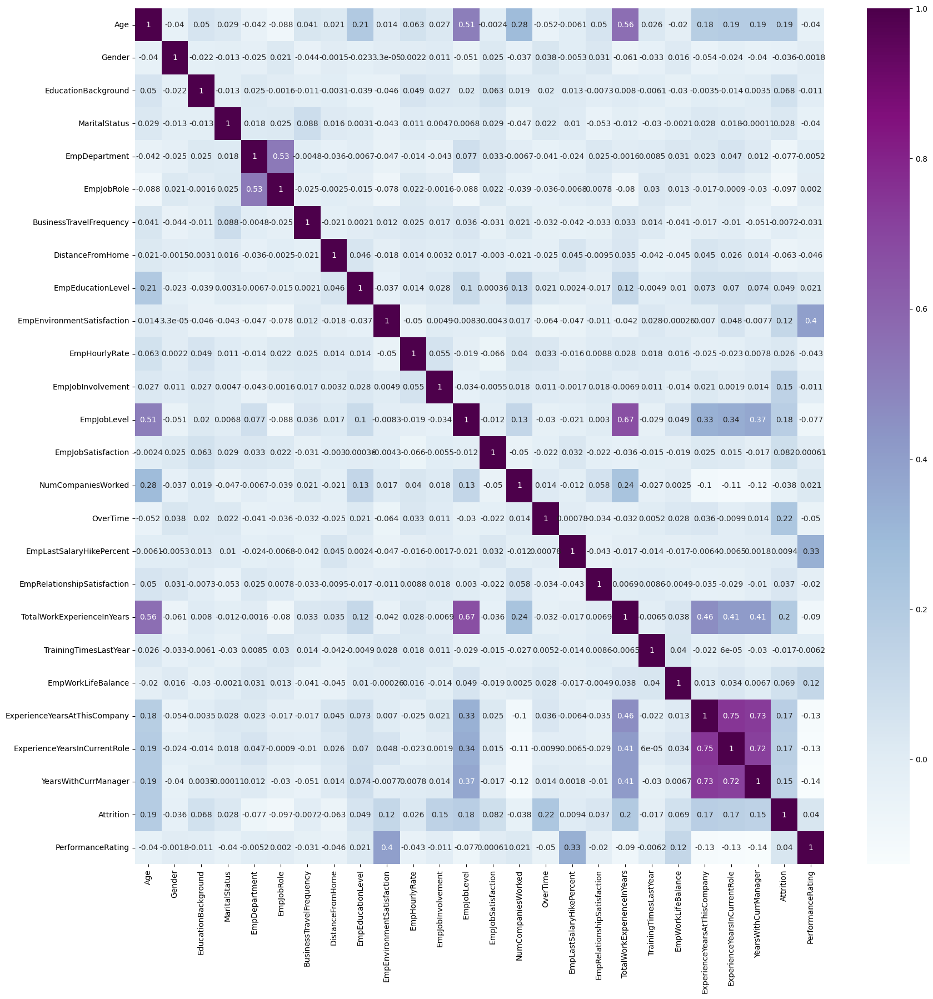

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True,cmap='BuPu')
plt.show()



From above heatmap scale we are clearly seen the their is no highly correlated feature in data



In [ ]:
# To get highly corelated feature
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


**PRINCIPLE COMPONENT ANALYSIS**

Principal component analysis (PCA) is a popular technique for analyzing large datasets containing a high number of dimensions/features per observation, increasing the interpretability of data while preserving the maximum amount of information, and enabling the visualization of multidimensional data. Formally, PCA is a statistical technique for reducing the dimensionality of a dataset.


**Used For**: The dataset contain more than 25 feature, removes the noise in the data and keeps only the most important features in the dataset. That will mitigate the overfitting of the data and increase the model's performance.

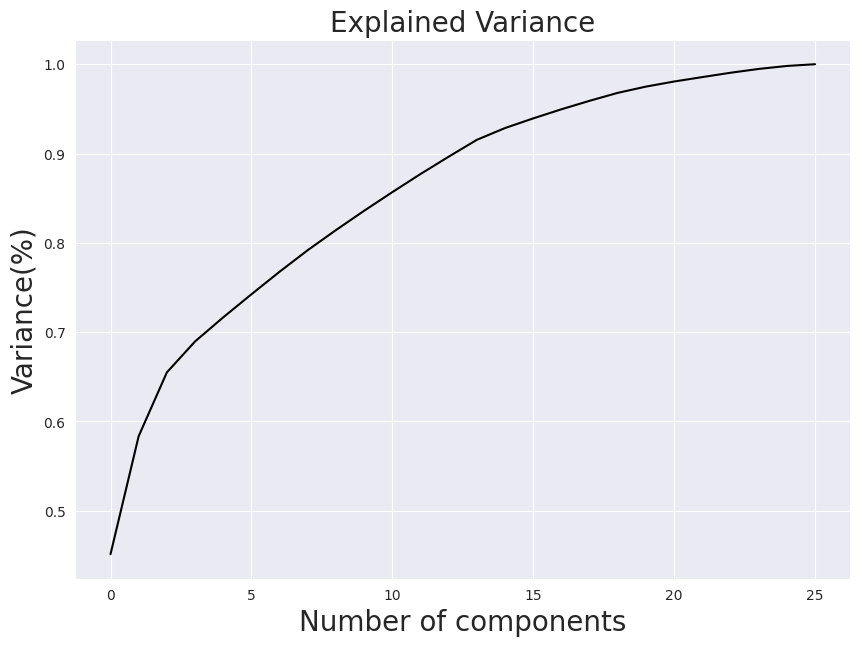

In [ ]:
# Getting the optimal value of PCA
from sklearn.decomposition import PCA

# Object creation
pca = PCA()

principlecomponent = pca.fit_transform(data)
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),color='k')
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()

**Observation**: Data is contain total 27 feature after dropping unique and constant column,from above PCA it shows the 25 feature has less varaince loss, so we are going to select 25 feature.

In [ ]:
# Selecting the components
pca = PCA(n_components=25)
new_data = pca.fit_transform(data)
new_data

array([[ 4.47461716e+00, -1.63560593e+00,  1.35987621e+00, ...,
         3.10695715e-01,  2.73622936e-01,  1.62067879e-01],
       [ 4.35738815e+00, -5.78705541e-02,  2.03984914e+00, ...,
        -1.75001965e-01,  6.84618293e-01,  2.95399760e-04],
       [ 4.24499121e+00,  2.58127897e+00,  4.42478564e+00, ...,
        -2.47450319e-01, -7.45476759e-01,  3.71271973e-01],
       ...,
       [-1.63617185e+00, -1.70581162e+00,  2.93429334e+00, ...,
         3.82850443e-01, -1.12063899e+00,  1.59847038e-02],
       [-9.09432080e+00, -2.06377521e+00,  9.51413543e-01, ...,
        -1.06420004e-01,  3.93245664e-01, -1.57389654e-01],
       [ 4.36719775e+00,  5.98465271e+00, -2.44147010e+00, ...,
        -1.08101073e-01,  1.21159952e-01, -5.08514388e-01]])

**CREATE NEW DATAFRAME**

In [ ]:
principle_df = pd.DataFrame(data=new_data,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25'])

# Add target veriable to preprocess dataframe for model building & evaluation
principle_df['PerformanceRating']=data.PerformanceRating

principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,PerformanceRating
0,4.474617,-1.635606,1.359876,-0.965490,1.550080,-0.179717,0.843739,1.594458,0.749029,0.020451,-1.286037,-0.058260,0.407345,0.249001,0.004244,-0.707790,-0.106931,0.601961,-0.097510,-0.039537,-0.287547,0.451346,0.310696,0.273623,0.162068,3
1,4.357388,-0.057871,2.039849,-1.537299,-0.291088,-1.628643,0.763073,-0.155870,1.045583,-0.797368,-1.703516,1.157972,-0.339029,-0.286234,0.145409,-0.500531,0.358400,-0.423352,0.879996,0.539284,-0.275408,0.922157,-0.175002,0.684618,0.000295,3
2,4.244991,2.581279,4.424786,0.162870,1.914806,-1.102650,-1.479360,-0.442567,0.838079,-1.505285,0.185119,2.371751,0.827040,-0.131010,0.736234,0.795708,-0.507253,-0.461541,-0.188903,0.380440,0.173953,0.417505,-0.247450,-0.745477,0.371272,4
3,-3.012637,0.735434,2.433771,-3.347248,-1.326405,2.357479,1.226972,-0.340809,-0.223106,0.053884,-0.142110,-1.405722,0.581401,-1.134294,-1.758583,0.218867,-0.891003,1.504801,-0.590889,-0.202439,0.223840,0.577573,-0.024454,0.471628,0.471033,3
4,4.249783,5.975149,-0.464801,-0.783218,-2.877106,-0.052133,-0.434443,0.391564,0.845524,-1.203842,-1.614499,0.128538,1.115261,0.095232,0.130931,-0.812941,0.300831,-1.104789,1.216270,-0.843609,0.101158,0.177141,0.471097,0.151107,0.447970,3


**SAVE PRE-PROCESS DATA**

In [ ]:
principle_df.to_csv('employee_performance_preprocessed_data.csv')

# Reading new preprocess csv file
df = pd.read_csv('employee_performance_preprocessed_data.csv')

# Get first five rows
df.head()

,Unnamed: 0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,PerformanceRating
0,0,4.474617,-1.635606,1.359876,-0.965490,1.550080,-0.179717,0.843739,1.594458,0.749029,0.020451,-1.286037,-0.058260,0.407345,0.249001,0.004244,-0.707790,-0.106931,0.601961,-0.097510,-0.039537,-0.287547,0.451346,0.310696,0.273623,0.162068,3
1,1,4.357388,-0.057871,2.039849,-1.537299,-0.291088,-1.628643,0.763073,-0.155870,1.045583,-0.797368,-1.703516,1.157972,-0.339029,-0.286234,0.145409,-0.500531,0.358400,-0.423352,0.879996,0.539284,-0.275408,0.922157,-0.175002,0.684618,0.000295,3
2,2,4.244991,2.581279,4.424786,0.162870,1.914806,-1.102650,-1.479360,-0.442567,0.838079,-1.505285,0.185119,2.371751,0.827040,-0.131010,0.736234,0.795708,-0.507253,-0.461541,-0.188903,0.380440,0.173953,0.417505,-0.247450,-0.745477,0.371272,4
3,3,-3.012637,0.735434,2.433771,-3.347248,-1.326405,2.357479,1.226972,-0.340809,-0.223106,0.053884,-0.142110,-1.405722,0.581401,-1.134294,-1.758583,0.218867,-0.891003,1.504801,-0.590889,-0.202439,0.223840,0.577573,-0.024454,0.471628,0.471033,3
4,4,4.249783,5.975149,-0.464801,-0.783218,-2.877106,-0.052133,-0.434443,0.391564,0.845524,-1.203842,-1.614499,0.128538,1.115261,0.095232,0.130931,-0.812941,0.300831,-1.104789,1.216270,-0.843609,0.101158,0.177141,0.471097,0.151107,0.447970,3


**MODEL CREATION & EVALUATION SUMMARY:**

Loading pre-process data

Define dependant & independant features

Balancing the target feature

Split training and testing data

Model creation, prediction & evaluation

Model saving

**LOADING PREPROCESS DATA**

In [ ]:
data = pd.read_csv('employee_performance_preprocessed_data.csv')
pd.set_option('display.max_columns',None) # Used to display the all features
data.drop('Unnamed: 0',axis=1,inplace=True) # Drop unwanted feature
data.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,PerformanceRating
0,4.474617,-1.635606,1.359876,-0.965490,1.550080,-0.179717,0.843739,1.594458,0.749029,0.020451,-1.286037,-0.058260,0.407345,0.249001,0.004244,-0.707790,-0.106931,0.601961,-0.097510,-0.039537,-0.287547,0.451346,0.310696,0.273623,0.162068,3
1,4.357388,-0.057871,2.039849,-1.537299,-0.291088,-1.628643,0.763073,-0.155870,1.045583,-0.797368,-1.703516,1.157972,-0.339029,-0.286234,0.145409,-0.500531,0.358400,-0.423352,0.879996,0.539284,-0.275408,0.922157,-0.175002,0.684618,0.000295,3
2,4.244991,2.581279,4.424786,0.162870,1.914806,-1.102650,-1.479360,-0.442567,0.838079,-1.505285,0.185119,2.371751,0.827040,-0.131010,0.736234,0.795708,-0.507253,-0.461541,-0.188903,0.380440,0.173953,0.417505,-0.247450,-0.745477,0.371272,4
3,-3.012637,0.735434,2.433771,-3.347248,-1.326405,2.357479,1.226972,-0.340809,-0.223106,0.053884,-0.142110,-1.405722,0.581401,-1.134294,-1.758583,0.218867,-0.891003,1.504801,-0.590889,-0.202439,0.223840,0.577573,-0.024454,0.471628,0.471033,3
4,4.249783,5.975149,-0.464801,-0.783218,-2.877106,-0.052133,-0.434443,0.391564,0.845524,-1.203842,-1.614499,0.128538,1.115261,0.095232,0.130931,-0.812941,0.300831,-1.104789,1.216270,-0.843609,0.101158,0.177141,0.471097,0.151107,0.447970,3


**DEFINE INDEPENDANT & DEPENDANT FEATURES**

In [ ]:
X = data.iloc[:,:-1]
y = data.PerformanceRating

In [ ]:
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25
0,4.474617,-1.635606,1.359876,-0.965490,1.550080,-0.179717,0.843739,1.594458,0.749029,0.020451,-1.286037,-0.058260,0.407345,0.249001,0.004244,-0.707790,-0.106931,0.601961,-0.097510,-0.039537,-0.287547,0.451346,0.310696,0.273623,0.162068
1,4.357388,-0.057871,2.039849,-1.537299,-0.291088,-1.628643,0.763073,-0.155870,1.045583,-0.797368,-1.703516,1.157972,-0.339029,-0.286234,0.145409,-0.500531,0.358400,-0.423352,0.879996,0.539284,-0.275408,0.922157,-0.175002,0.684618,0.000295
2,4.244991,2.581279,4.424786,0.162870,1.914806,-1.102650,-1.479360,-0.442567,0.838079,-1.505285,0.185119,2.371751,0.827040,-0.131010,0.736234,0.795708,-0.507253,-0.461541,-0.188903,0.380440,0.173953,0.417505,-0.247450,-0.745477,0.371272
3,-3.012637,0.735434,2.433771,-3.347248,-1.326405,2.357479,1.226972,-0.340809,-0.223106,0.053884,-0.142110,-1.405722,0.581401,-1.134294,-1.758583,0.218867,-0.891003,1.504801,-0.590889,-0.202439,0.223840,0.577573,-0.024454,0.471628,0.471033
4,4.249783,5.975149,-0.464801,-0.783218,-2.877106,-0.052133,-0.434443,0.391564,0.845524,-1.203842,-1.614499,0.128538,1.115261,0.095232,0.130931,-0.812941,0.300831,-1.104789,1.216270,-0.843609,0.101158,0.177141,0.471097,0.151107,0.447970


In [ ]:
y.head()

,PerformanceRating
0,3
1,3
2,4
3,3
4,3


**BALANCING THE TARGET FEATURE**

In [ ]:
from collections import Counter
from imblearn.over_sampling import SMOTE #SMOTE(synthetic minority oversampling techinque)
sm = SMOTE() # obeject creation
print("unbalanced data   :  ",Counter(y))
X_sm,y_sm = sm.fit_resample(X,y)
print("balanced data:    :",Counter(y_sm))

unbalanced data   :   Counter({3: 874, 2: 194, 4: 132})
balanced data:    : Counter({3: 874, 4: 874, 2: 874})


**SPLIT TRAINING AND TESTING DATA**

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_sm,y_sm,random_state=42,test_size=0.20) # 20% data given to testing

In [ ]:
# Check shape of train and test
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2097, 25), (525, 25), (2097,), (525,))

**1.Support Vector Machine**

In [ ]:
# importing library
from sklearn.svm import SVC

# Object Creaation
svc = SVC()

# Fitting training and testing data
svc.fit(X_train,y_train)

# Prediction on train data
svc_train_predict = svc.predict(X_train)

# Prediction on test data
svc_test_predict = svc.predict(X_test)

**TRAINING ACCURACY**

In [ ]:
# import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report,confusion_matrix
svc_train_accuracy = accuracy_score(svc_train_predict,y_train)
print("Training accuracy of support vector classifier model",svc_train_accuracy*100)
print("support vector classifier Classification report: \n",classification_report(svc_train_predict,y_train))

Training accuracy of support vector classifier model 99.95231282784931
support vector classifier Classification report: 
               precision    recall  f1-score   support

           2       1.00      1.00      1.00       690
           3       1.00      1.00      1.00       700
           4       1.00      1.00      1.00       707

    accuracy                           1.00      2097
   macro avg       1.00      1.00      1.00      2097
weighted avg       1.00      1.00      1.00      2097



**TESTING ACCURACY**

In [ ]:

svc_test_accuracy = accuracy_score(svc_test_predict,y_test)
print("Testing accuracy of support vector classifier model",svc_test_accuracy*100)
print("Prcision Score:", precision_score(svc_test_predict, y_test, average='weighted')*100)
print("support vector classifier Classification report: \n",classification_report(svc_test_predict,y_test))

Testing accuracy of support vector classifier model 100.0
Prcision Score: 100.0
support vector classifier Classification report: 
               precision    recall  f1-score   support

           2       1.00      1.00      1.00       184
           3       1.00      1.00      1.00       173
           4       1.00      1.00      1.00       168

    accuracy                           1.00       525
   macro avg       1.00      1.00      1.00       525
weighted avg       1.00      1.00      1.00       525



In [ ]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
pd.crosstab(svc_test_predict,y_test)

PerformanceRating,2,3,4
row_0,,,
2,184,0,0
3,0,173,0
4,0,0,168


**2.Random Forest**

In [ ]:
# importing libary and creating object
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100) # 100 decision tree

# fitting training data
rf.fit(X_train,y_train)

# Prediction on testing data
rf_test_predict = rf.predict(X_test)

# Prediction on training data
rf_train_predict = rf.predict(X_train)

**TRANING ACCURACY**

In [ ]:
rf_train_accuracy = accuracy_score(rf_train_predict,y_train)
print("Training accuracy of random forest",rf_train_accuracy)
print("Classification report of training: \n",classification_report(rf_train_predict,y_train))

Training accuracy of random forest 1.0
Classification report of training: 
               precision    recall  f1-score   support

           2       1.00      1.00      1.00       690
           3       1.00      1.00      1.00       701
           4       1.00      1.00      1.00       706

    accuracy                           1.00      2097
   macro avg       1.00      1.00      1.00      2097
weighted avg       1.00      1.00      1.00      2097



**TESTING ACCURACY**

In [ ]:
rf_test_accuracy = accuracy_score(rf_test_predict,y_test)
print("Testing accuracy of random forest",rf_test_accuracy*100)
print("Precision Score:", precision_score(rf_test_predict, y_test, average='weighted')*100)
print("Classification report of testing: \n",classification_report(rf_test_predict,y_test))

Testing accuracy of random forest 99.23809523809524
Precision Score: 99.24263095537286
Classification report of testing: 
               precision    recall  f1-score   support

           2       0.99      0.98      0.99       186
           3       0.98      0.99      0.99       171
           4       1.00      1.00      1.00       168

    accuracy                           0.99       525
   macro avg       0.99      0.99      0.99       525
weighted avg       0.99      0.99      0.99       525



**3.Artificial Neural Network [MLP Classifier]**

In [ ]:
# Importing library and object creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=250,
                      random_state=42)

In [ ]:
# Fitting the training data
model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=250, random_state=42)

In [ ]:
# Predicting the probability
mlp_prdict_probability = model.predict_proba(X_test)
mlp_prdict_probability

array([[8.57744124e-03, 9.90968775e-01, 4.53783746e-04],
       [6.91206746e-04, 9.98284744e-01, 1.02404902e-03],
       [9.95347102e-01, 4.64676886e-03, 6.12934077e-06],
       ...,
       [9.96497740e-01, 3.49943116e-03, 2.82888449e-06],
       [1.62130418e-02, 9.83267865e-01, 5.19093492e-04],
       [6.20552294e-12, 5.70331565e-05, 9.99942967e-01]])

In [ ]:
# Prediction on test data
mlp_test_predict = model.predict(X_test)

# Prediction on training data
mlp_train_predict = model.predict(X_train)

**TRAINING ACCURACY**

In [ ]:
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 100.0
Classification report of training:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00       690
           3       1.00      1.00      1.00       701
           4       1.00      1.00      1.00       706

    accuracy                           1.00      2097
   macro avg       1.00      1.00      1.00      2097
weighted avg       1.00      1.00      1.00      2097



**TESTING ACCURACY**

In [ ]:
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Precision Score:",precision_score(mlp_test_predict, y_test, average='weighted')*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 100.0
Precision Score: 100.0
Classification report of testing:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00       184
           3       1.00      1.00      1.00       173
           4       1.00      1.00      1.00       168

    accuracy                           1.00       525
   macro avg       1.00      1.00      1.00       525
weighted avg       1.00      1.00      1.00       525



In [ ]:
pd.crosstab(mlp_test_predict,y_test)

PerformanceRating,2,3,4
row_0,,,
2,184,0,0
3,0,173,0
4,0,0,168


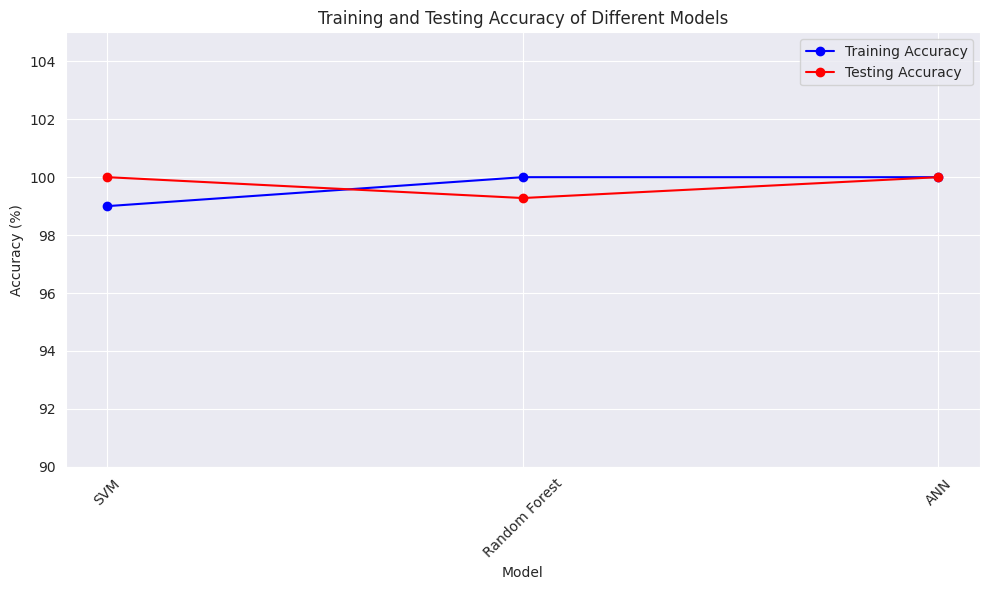

In [ ]:
import matplotlib.pyplot as plt

# Model names
models = ['SVM', 'Random Forest', 'ANN']

# Training accuracies
training_accuracies = [99, 100, 100]

# Testing accuracies
testing_accuracies = [100, 99.28, 100]

# Plotting
plt.figure(figsize=(10, 6))

# Plot training accuracies
plt.plot(models, training_accuracies, marker='o', linestyle='-', color='b', label='Training Accuracy')

# Plot testing accuracies
plt.plot(models, testing_accuracies, marker='o', linestyle='-', color='r', label='Testing Accuracy')

plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('Training and Testing Accuracy of Different Models')
plt.ylim(90, 105)  # Setting y-axis limit
plt.legend()
plt.grid(True)  # Add grid
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

**Conclusion:**

Support Vector Machine:

Training Accuracy: 99%

Testing Accuracy: 100%


Random Forest:

Training Accuracy: 100%

Testing Accuracy: 99%


Artificial Neural Network (Multilayer Perceptron):

Training Accuracy: 100%

Testing Accuracy: 100 %


Among these models, the Artificial Neural Network (Multilayer Perceptron) stands out as it achieved high accuracy in both training and testing phases, with a training accuracy of 100% and a testing accuracy of 99.9% with 95.97% precision score. This model strikes a good balance between high training accuracy and a strong testing accuracy, making it a strong candidate for being the "sweet spot" model.